In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly.express as px


import warnings
warnings.filterwarnings('ignore')

plt.style.use('fivethirtyeight')
%matplotlib inline

In [3]:
import pandas as pd
df = pd.read_excel("/content/Concrete_Data.xls")


In [6]:
#df.describe()
df.columns = df.columns.str.replace(r"\(.*?\)", "", regex=True).str.strip()
df.head(3)

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.269535


In [7]:
df.dtypes

,0
Cement,float64
Blast Furnace Slag,float64
Fly Ash,float64
Water,float64
Superplasticizer,float64
Coarse Aggregate,float64
Fine Aggregate,float64
Age,int64
Concrete compressive strength,float64


Summary of Scalers:

StandardScaler: Good for data that is normally distributed or you expect to be close to a normal distribution.

MinMaxScaler: Scales data to a specific range, good when you want your data to be between 0 and 1.

RobustScaler: Handles outliers well by using median and interquartile range.

Log Transformation: Helps compress data with large values or exponential growth.

In [11]:
#!pip install ydata-profiling

from ydata_profiling import ProfileReport


In [12]:
# Create a ProfileReport
profile = ProfileReport(df, title="Sample Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
df.isna().sum()

,0
Cement,0
Blast Furnace Slag,0
Fly Ash,0
Water,0
Superplasticizer,0
Coarse Aggregate,0
Fine Aggregate,0
Age,0
Concrete compressive strength,0


In [14]:
zeros_in_columns = df.eq(0).any()
zeros_in_columns

,0
Cement,False
Blast Furnace Slag,True
Fly Ash,True
Water,False
Superplasticizer,True
Coarse Aggregate,False
Fine Aggregate,False
Age,False
Concrete compressive strength,False


In [15]:
zero_counts = (df==0).sum()
zero_counts

,0
Cement,0
Blast Furnace Slag,466
Fly Ash,566
Water,0
Superplasticizer,379
Coarse Aggregate,0
Fine Aggregate,0
Age,0
Concrete compressive strength,0


In [16]:
df.shape

(1030, 9)

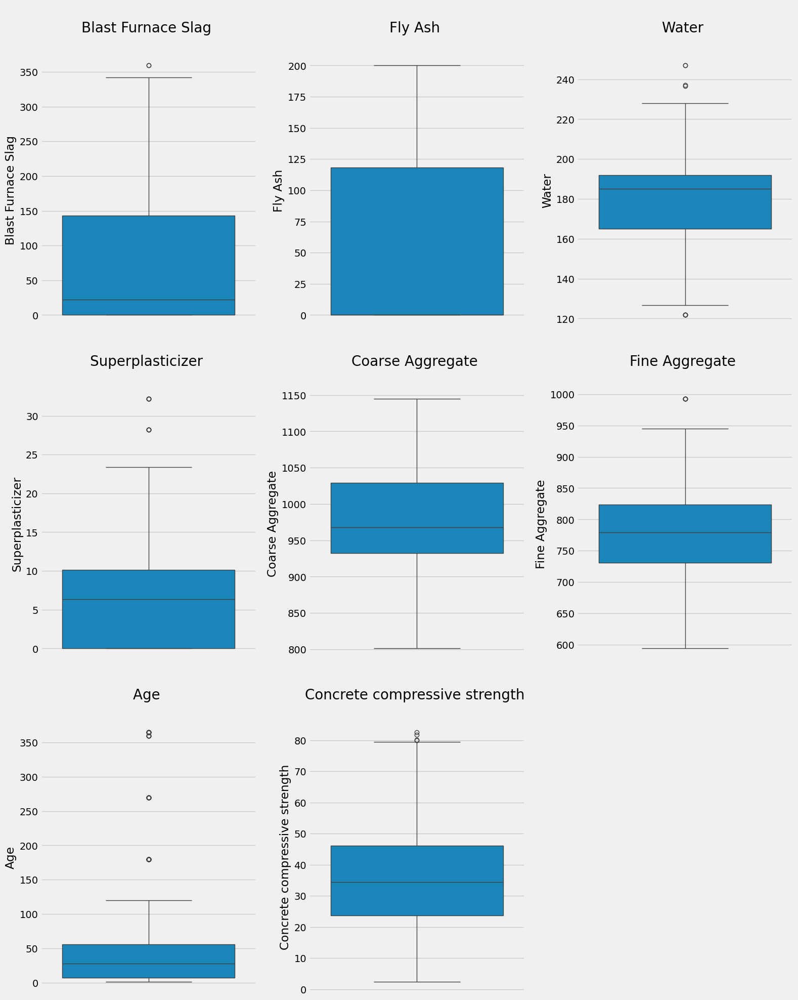

In [17]:
#Outlier detection
cols = df.columns

plt.figure(figsize = (16, 20))
plotnumber = 1

for i in range(1, len(cols)):
    if plotnumber <= 9:
        ax = plt.subplot(3, 3, plotnumber)
        sns.boxplot(y = cols[i], data = df, ax = ax)
        plt.title(f"\n{cols[i]} \n", fontsize = 20)

    plotnumber += 1

plt.tight_layout()
plt.show()


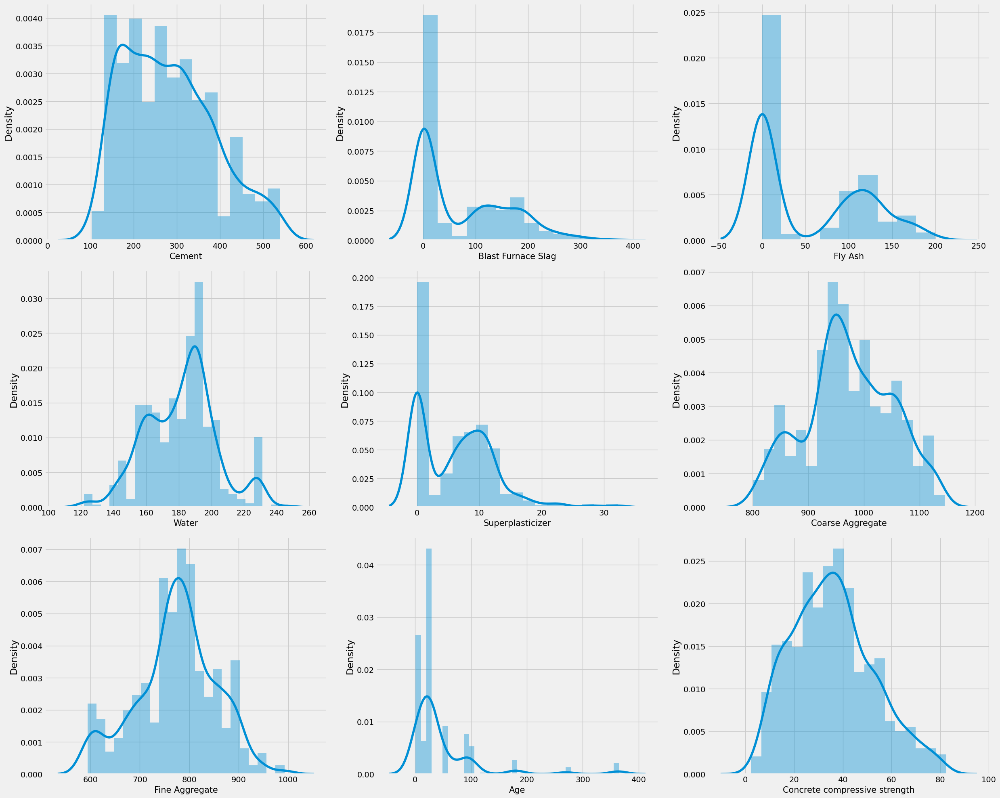

In [18]:
# Distribution Plot
plt.figure(figsize = (25, 20))
plotnumber = 1

for col in df.columns:
    if plotnumber <= 9:
        ax = plt.subplot(3, 3, plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 15)

    plotnumber += 1

plt.tight_layout()
plt.show()

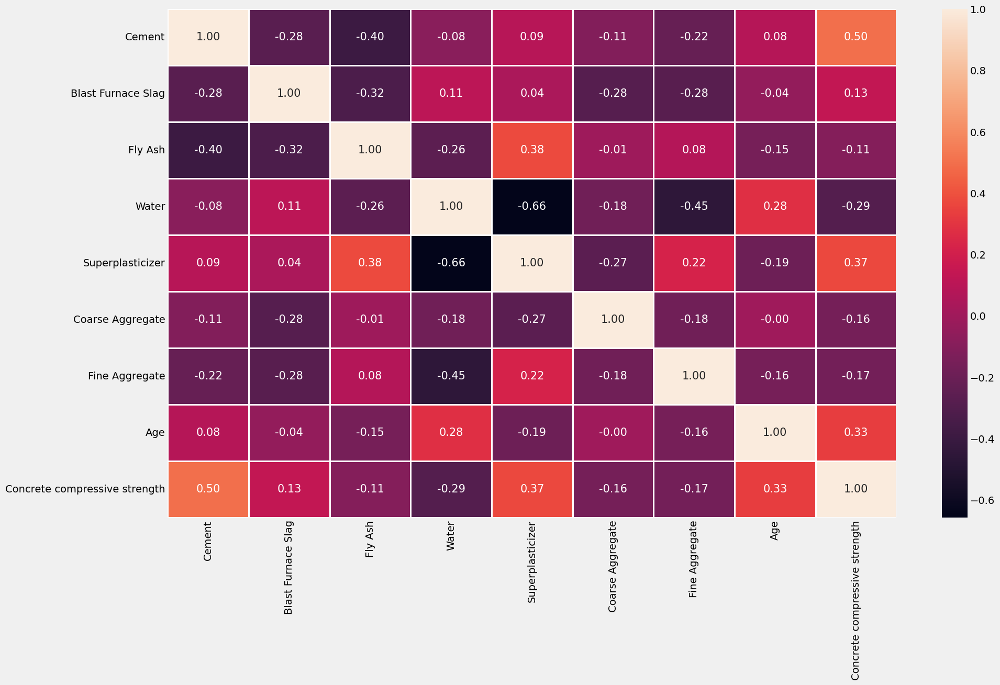

In [19]:
# Corelation Analysis
plt.figure(figsize = (20, 12))
sns.heatmap(df.corr(), annot = True, fmt = '0.2f', annot_kws = {'size' : 15}, linewidth = 2, linecolor = 'white')
plt.show()

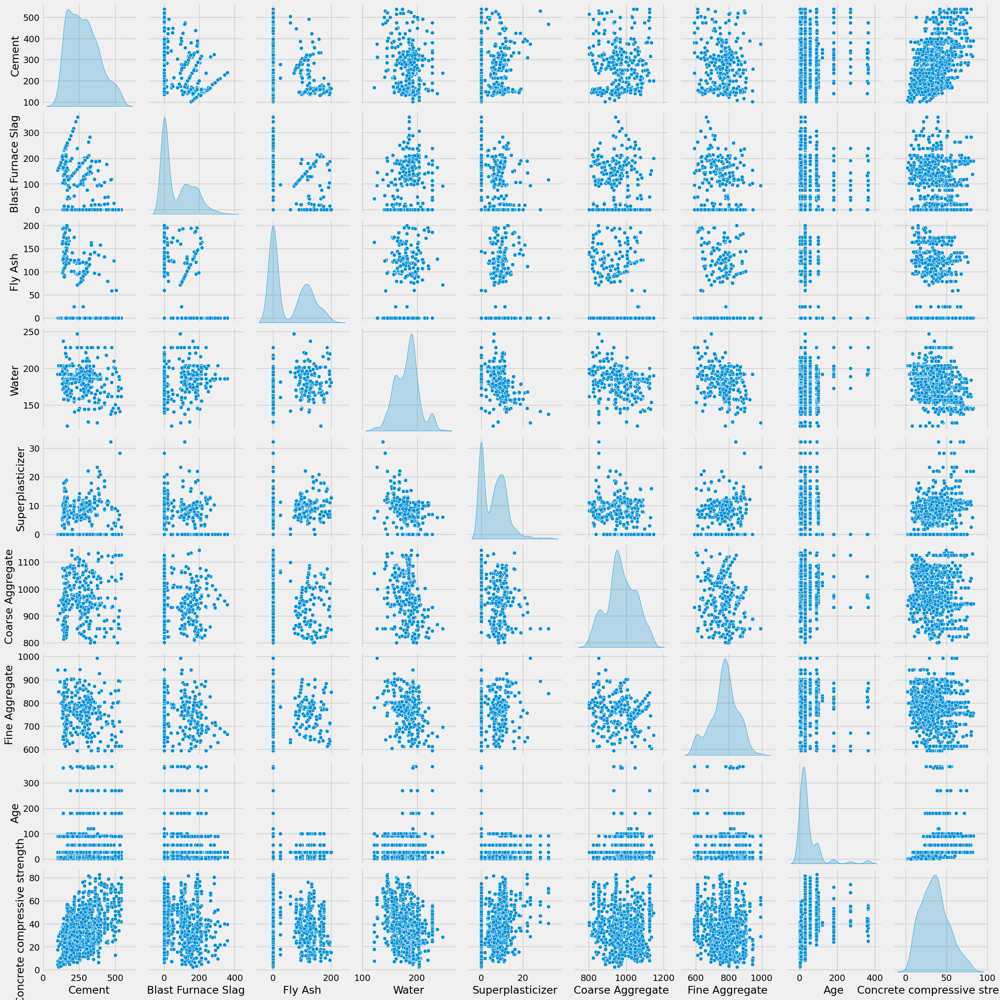

<Figure size 640x480 with 0 Axes>

In [20]:
# Pair Plot
sns.pairplot(df, diag_kind='kde')
plt.show()
plt.savefig('pairplot.png')

In [23]:
# Feature Engineering
# creating feature and label

x = df.iloc[:, :-1]
y = df.iloc[:, -1]

In [24]:
x.var()

,0
Cement,10921.742654
Blast Furnace Slag,7444.083725
Fly Ash,4095.548093
Water,456.060245
Superplasticizer,35.682602
Coarse Aggregate,6045.656228
Fine Aggregate,6428.099159
Age,3990.437729


In [35]:
# normalizing features
# let's add 1 to each value in everycolumn so that we don't get exception while calculating the log value of 0

import numpy as np
x = np.log1p(x)

In [40]:
x.var()

,0
Cement,0.143939
Blast Furnace Slag,5.816392
Fly Ash,5.641045
Water,0.014066
Superplasticizer,1.333888
Coarse Aggregate,0.006475
Fine Aggregate,0.011292
Age,1.233057


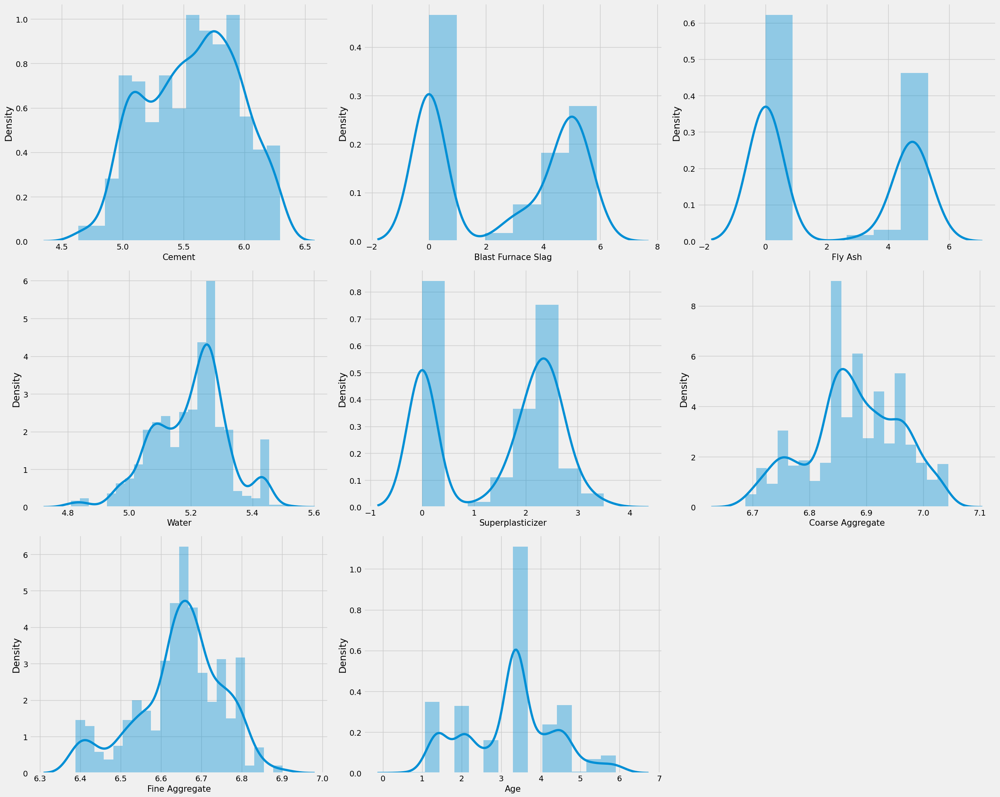

In [38]:
plt.figure(figsize = (25, 20))
plotnumber = 1

for col in x.columns:
    if plotnumber <= 8:
        ax = plt.subplot(3, 3, plotnumber)
        sns.distplot(x[col])
        plt.xlabel(col, fontsize = 15)

    plotnumber += 1

plt.tight_layout()
plt.show()

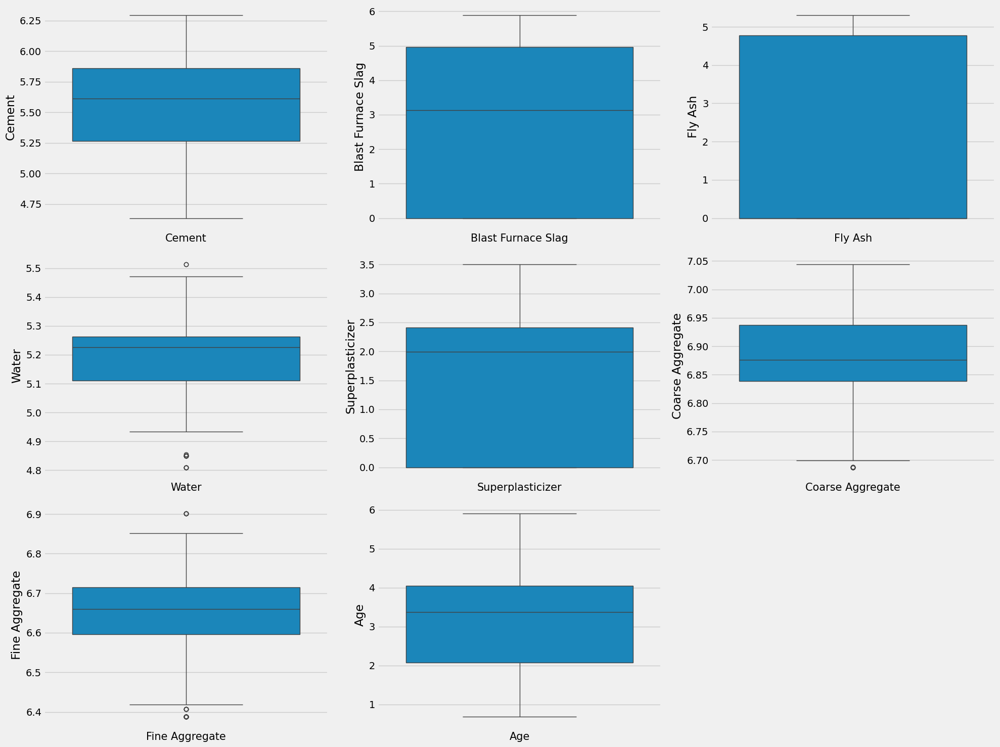

In [41]:
plt.figure(figsize = (20, 15))
plotnumber = 1

for col in x.columns:
    if plotnumber <= 8:
        ax = plt.subplot(3, 3, plotnumber)
        sns.boxplot(x[col])
        plt.xlabel(col, fontsize = 15)

    plotnumber += 1
plt.tight_layout()
plt.show()


In [44]:
#splitting data into training and test set

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25)

In [47]:
# Scaling data

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)


In [51]:
# Linear Regression
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x_train,y_train)


LinearRegression()

In [49]:
lr.score(x_train,y_train)

0.7936080542886002

In [50]:
lr.score(x_test,y_test)

0.8226692107945279

In [52]:
# Lasso Regression
from sklearn.linear_model import Lasso, LassoCV

In [56]:
lassocv = LassoCV(alphas = None, cv = 10, max_iter = 10000)
lassocv.fit(x_train, y_train)

LassoCV(cv=10, max_iter=10000)

In [58]:
lassocv.score(x_train,y_train)

0.7935856705316288

In [59]:
lassocv.score(x_test,y_test)

0.822514973986314

In [60]:
# Decision Tree Regressor

from sklearn.tree import DecisionTreeRegressor

dtr = DecisionTreeRegressor()
dtr.fit(x_train, y_train)

DecisionTreeRegressor()

In [61]:
dtr.score(x_train,y_train)

0.9959234402162382

In [62]:
dtr.score(x_test,y_test)

0.8750426340506816

In [63]:
# Hyper parameter tuning decision tree regressor

from sklearn.model_selection import GridSearchCV

grid_params = {
    'criterion' : ['mse', 'friedman_mse', 'mae'],
    'splitter' : ['best', 'random'],
    'max_depth' : [3, 5, 7, 9, 10],
    'min_samples_split' : [1, 2, 3, 4, 5],
    'min_samples_leaf' : [1, 2, 3, 4, 5]
}

grid_search = GridSearchCV(dtr, grid_params, cv=5, n_jobs = -1, verbose = 1)
grid_search.fit(x_train, y_train)

Fitting 5 folds for each of 750 candidates, totalling 3750 fits


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(), n_jobs=-1,
             param_grid={'criterion': ['mse', 'friedman_mse', 'mae'],
                         'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [1, 2, 3, 4, 5],
                         'min_samples_split': [1, 2, 3, 4, 5],
                         'splitter': ['best', 'random']},
             verbose=1)

In [64]:
# best parameters and best score

print(grid_search.best_params_)
print(grid_search.best_score_)

{'criterion': 'friedman_mse', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}
0.8234417683960731


In [66]:
dtr = DecisionTreeRegressor(criterion= 'friedman_mse', max_depth= 10, min_samples_leaf = 1, min_samples_split= 2, splitter= 'best')

In [67]:
dtr.fit(x_train,y_train)

DecisionTreeRegressor(criterion='friedman_mse', max_depth=10)

In [68]:
dtr.score(x_train,y_train)

0.9785301142905372

In [69]:
dtr.score(x_test,y_test)

0.8675381116257197

In [71]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor()
rfr.fit(x_train, y_train)

RandomForestRegressor()

In [73]:
rfr.score(x_train, y_train)

0.9849668580051363

In [74]:
rfr.score(x_test, y_test)

0.9268297091713146

In [77]:
# ADA boost Regressor
from sklearn.ensemble import AdaBoostRegressor

ada = AdaBoostRegressor(estimator = dtr)
ada.fit(x_train, y_train)


AdaBoostRegressor(estimator=DecisionTreeRegressor(criterion='friedman_mse',
                                                  max_depth=10))

In [78]:
ada.score(x_train, y_train)

0.9648596058229558

In [79]:
ada.score(x_test, y_test)

0.9099390857821316

In [80]:
# hyper parameter tuning

grid_params = {
    'n_estimators' : [40, 50, 80, 100],
    'learning_rate' : [0.01, 0.1, 0.05, 0.5, 1, 10],
    'loss' : ['linear','square', 'exponential']
}

grid_search = GridSearchCV(ada, grid_params, cv = 5, n_jobs = -1, verbose = 1)
grid_search.fit(x_train, y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


GridSearchCV(cv=5,
             estimator=AdaBoostRegressor(estimator=DecisionTreeRegressor(criterion='friedman_mse',
                                                                         max_depth=10)),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.05, 0.5, 1, 10],
                         'loss': ['linear', 'square', 'exponential'],
                         'n_estimators': [40, 50, 80, 100]},
             verbose=1)

In [81]:
# best parameters and best score

print(grid_search.best_params_)
print(grid_search.best_score_)

{'learning_rate': 0.05, 'loss': 'square', 'n_estimators': 80}
0.9008695207759102


In [83]:
ada = AdaBoostRegressor(estimator = dtr, learning_rate = 0.05, loss = 'square', n_estimators = 80)
ada.fit(x_train, y_train)

AdaBoostRegressor(estimator=DecisionTreeRegressor(criterion='friedman_mse',
                                                  max_depth=10),
                  learning_rate=0.05, loss='square', n_estimators=80)

In [84]:
ada.score(x_train, y_train)

0.9924287345988289

In [85]:
ada.score(x_test, y_test)

0.921799308839641

In [86]:
#Gradient Boost Regression

from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor()
gbr.fit(x_train, y_train)

GradientBoostingRegressor()

In [87]:
gbr.score(x_train, y_train)

0.9482920989594147

In [88]:
gbr.score(x_test, y_test)

0.9210690049512913

In [89]:
# hyper parameter tuning of gradient boost regressor

grid_params = {
    'n_estimators': [90, 100, 120, 180, 200],
    'learning_rate' : [0.01, 0.1, 0.05, 0.5, 1],
    'loss' : ['ls', 'lad', 'huber', 'quantile']
}

grid_search = GridSearchCV(gbr, grid_params, cv = 5, n_jobs = -1, verbose = 1)
grid_search.fit(x_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.05, 0.5, 1],
                         'loss': ['ls', 'lad', 'huber', 'quantile'],
                         'n_estimators': [90, 100, 120, 180, 200]},
             verbose=1)

In [91]:
# best parameters and best score

print(grid_search.best_params_)
print(grid_search.best_score_)

{'learning_rate': 0.5, 'loss': 'huber', 'n_estimators': 200}
0.9144771934586545


In [93]:
gbr = GradientBoostingRegressor(learning_rate = 0.5, loss = 'huber', n_estimators = 200)
gbr.fit(x_train, y_train)

GradientBoostingRegressor(learning_rate=0.5, loss='huber', n_estimators=200)

In [94]:
gbr.score(x_train, y_train)

0.9871283028963367

In [95]:
gbr.score(x_test, y_test)

0.9340687561197178

In [96]:
#  XGBoost Regression

In [97]:
from xgboost import XGBRegressor

xgb = XGBRegressor(booster = 'gbtree', learning_rate = 0.1, max_depth = 7, n_estimators = 200)
xgb.fit(x_train, y_train)

XGBRegressor(base_score=None, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [100]:
xgb.score(x_train, y_train)

0.9954375984253118

In [101]:
xgb.score(x_test, y_test)

0.9426734831534734

In [104]:
from sklearn.ensemble import VotingRegressor

regressors = [('Linear Regression', lr), ('Lasso Regression', lassocv), ('Decision Tree', dtr), ('Random Forest', rfr), ('Ada Boost', ada), ('Gradient Boost', gbr),
              ('XgBoost', xgb)]

vr = VotingRegressor(estimators = regressors, n_jobs = -1, verbose = 1, weights = (0.1, 0.1, 0.1, 0.2, 0.2, 0.7, 0.8))
vr.fit(x_train, y_train)

VotingRegressor(estimators=[('Linear Regression', LinearRegression()),
                            ('Lasso Regression',
                             LassoCV(cv=10, max_iter=10000)),
                            ('Decision Tree',
                             DecisionTreeRegressor(criterion='friedman_mse',
                                                   max_depth=10)),
                            ('Random Forest', RandomForestRegressor()),
                            ('Ada Boost',
                             AdaBoostRegressor(estimator=DecisionTreeRegressor(criterion='friedman_mse',
                                                                               max_depth=10),
                                               learning_rat...
                                          interaction_constraints=None,
                                          learning_rate=0.1, max_bin=None,
                                          max_cat_threshold=None,
                                          max_cat_to_onehot=None,
                                          max_delta_step=None, max_depth=7,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None, n_estimators=200,
                                          n_jobs=None, num_parallel_tree=None,
                                          random_state=None, ...))],
                n_jobs=-1, verbose=1,
                weights=(0.1, 0.1, 0.1, 0.2, 0.2, 0.7, 0.8))

In [105]:
vr.score(x_train, y_train)

0.9911676151192491

In [107]:
vr.score(x_test, y_test)

0.9525912536357465

In [109]:
models = pd.DataFrame({
    'Model' : ['Linear Regression', 'Lasso Regression', 'Decision Tree', 'Random Forest', 'Ada Boost', 'Gradient Boost', 'XgBoost', "Voting Regressor"],
    'Score' : [lr.score(x_test, y_test), lassocv.score(x_test, y_test), dtr.score(x_test, y_test), rfr.score(x_test, y_test), ada.score(x_test, y_test),
               gbr.score(x_test, y_test), xgb.score(x_test, y_test), vr.score(x_test, y_test)]
})


models.sort_values(by = 'Score', ascending = False)

,Model,Score
7,Voting Regressor,0.952591
6,XgBoost,0.942673
5,Gradient Boost,0.934069
3,Random Forest,0.926830
4,Ada Boost,0.921799
2,Decision Tree,0.867538
0,Linear Regression,0.822669
1,Lasso Regression,0.822515


In [110]:
px.bar(data_frame = models, x = 'Score', y = 'Model', color = 'Score', title = 'Models Comparison')

In [118]:
vr.predict(x_test[1].reshape(1,-1))

array([58.09039644])

In [120]:
y_test.iloc[1]

63.528318639999995

In [123]:
vr.predict(x_test[0].reshape(1,-1))

array([26.36619732])

In [124]:
y_test.iloc[0]

24.84871504